<a href="https://colab.research.google.com/github/Brenda-Martinez-Martinez/CIS-3902-Data-Mining/blob/main/Predicting_the_GPA_of_Higher_Education_Students_Using_Machine_Learning_(1)_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

**Abstract:** This project analyzes the GPA of students in higher education.

**Student Name:** Brenda Martinez Martinez

# Imports

In [ ]:
# Basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# AutoViz
!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class


# PyCaret
!pip install pycaret
from pycaret.classification import *

# Warnings
import warnings
warnings.filterwarnings('ignore')


# Input Data

The Dataset's features are numbered so as to not put the entire title in there.
<p>0-Student ID
<p>1- Student Age (1: 18-21, 2: 22-25, 3: above 26)
<p>2- Sex (1: female, 2: male)
<p>3- Graduated high-school type: (1: private, 2: state, 3: other)
<p>4- Scholarship type: (1: None, 2: 25%, 3: 50%, 4: 75%, 5: Full)
<p>5- Additional work: (1: Yes, 2: No)
<p>6- Regular artistic or sports activity: (1: Yes, 2: No)
<p>7- Do you have a partner: (1: Yes, 2: No)
<p>8- Total salary if available (1: USD 135-200, 2: USD 201-270, 3: USD 271-340, 4: USD 341-410, 5: above 410)
<p>9- Transportation to the university: (1: Bus, 2: Private car/taxi, 3: bicycle, 4: Other)
<p>10- Accommodation type in Cyprus: (1: rental, 2: dormitory, 3: with family, 4: Other)
<p>11- Mothersâ€™ education: (1: primary school, 2: secondary school, 3: high school, 4: university, 5: MSc., 6: Ph.D.)
<p>12- Fathersâ€™ education: (1: primary school, 2: secondary school, 3: high school, 4: university, 5: MSc., 6: Ph.D.)
<p>13- Number of sisters/brothers (if available): (1: 1, 2:, 2, 3: 3, 4: 4, 5: 5 or above)
<p>14- Parental status: (1: married, 2: divorced, 3: died - one of them or both)
<p>15- Mothersâ€™ occupation: (1: retired, 2: housewife, 3: government officer, 4: private sector employee, 5: self-employment, 6: other)
<p>16- Fathersâ€™ occupation: (1: retired, 2: government officer, 3: private sector employee, 4: self-employment, 5: other)
<p>17- Weekly study hours: (1: None, 2: <5 hours, 3: 6-10 hours, 4: 11-20 hours, 5: more than 20 hours)
<p>18- Reading frequency (non-scientific books/journals): (1: None, 2: Sometimes, 3: Often)
<p>19- Reading frequency (scientific books/journals): (1: None, 2: Sometimes, 3: Often)
<p>20- Attendance to the seminars/conferences related to the department: (1: Yes, 2: No)
<p>21- Impact of your projects/activities on your success: (1: positive, 2: negative, 3: neutral)
<p>22- Attendance to classes (1: always, 2: sometimes, 3: never)
<p>23- Preparation to midterm exams 1: (1: alone, 2: with friends, 3: not applicable)
<p>24- Preparation to midterm exams 2: (1: closest date to the exam, 2: regularly during the semester, 3: never)
<p>25- Taking notes in classes: (1: never, 2: sometimes, 3: always)
<p>26- Listening in classes: (1: never, 2: sometimes, 3: always)
<p>27- Discussion improves my interest and success in the course: (1: never, 2: sometimes, 3: always)
<p>28- Flip-classroom: (1: not useful, 2: useful, 3: not applicable)
<p>29- Cumulative grade point average in the last semester (/4.00): (1: <2.00, 2: 2.00-2.49, 3: 2.50-2.99, 4: 3.00-3.49, 5: above 3.49)
<p>30- Expected Cumulative grade point average in the graduation (/4.00): (1: <2.00, 2: 2.00-2.49, 3: 2.50-2.99, 4: 3.00-3.49, 5: above 3.49)
<p>31- Course ID
<p>32- OUTPUT Grade (0: Fail, 1: DD, 2: DC, 3: CC, 4: CB, 5: BB, 6: BA, 7: AA)

In [ ]:
# Load Titanic dataset from seaborn (as sample input)
import seaborn as sns
df = pd.read_csv("https://raw.githubusercontent.com/Brenda-Martinez-Martinez/Project_Spring_2025/refs/heads/main/DATA%20(1).csv")
#df.to_csv('titanic.csv', index=False)  # Save a local copy for AutoViz
df.head()

,STUDENT ID,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,COURSE ID,GRADE
0,STUDENT1,2,2,3,3,1,2,2,1,1,1,1,2,3,1,2,5,3,2,2,1,1,1,1,1,3,2,1,2,1,1,1,1
1,STUDENT2,2,2,3,3,1,2,2,1,1,1,2,3,2,1,2,1,2,2,2,1,1,1,1,1,3,2,3,2,2,3,1,1
2,STUDENT3,2,2,2,3,2,2,2,2,4,2,2,2,2,1,2,1,2,1,2,1,1,1,1,1,2,2,1,1,2,2,1,1
3,STUDENT4,1,1,1,3,1,2,1,2,1,2,1,2,5,1,2,1,3,1,2,1,1,1,1,2,3,2,2,1,3,2,1,1
4,STUDENT5,2,2,1,3,2,2,1,3,1,4,3,3,2,1,2,4,2,1,1,1,1,1,2,1,2,2,2,1,2,2,1,1


In [ ]:
# Create a dictionary mapping column numbers to short, understandable names
column_names = {
    "1": "age_group",
    "2": "sex",
    "3": "hs_type",
    "4": "scholarship",
    "5": "add_work",
    "6": "art_sport",
    "7": "partner",
    "8": "salary",
    "9": "transport",
    "10": "accom",
    "11": "mom_edu",
    "12": "dad_edu",
    "13": "siblings",
    "14": "parent_status",
    "15": "mom_job",
    "16": "dad_job",
    "17": "study_hours",
    "18": "read_freq_non_sci",
    "19": "read_freq_sci",
    "20": "seminars",
    "21": "project_impact",
    "22": "attendance",
    "23": "prep_mid1",
    "24": "prep_mid2",
    "25": "note_taking",
    "26": "listening",
    "27": "discussion_help",
    "28": "flip_class",
    "29": "gpa_last",
    "30": "gpa_exp"
}

# Rename the columns
df.rename(columns=column_names, inplace=True)

# Check the column names
df.columns


Index(['STUDENT ID', 'age_group', 'sex', 'hs_type', 'scholarship', 'add_work',
       'art_sport', 'partner', 'salary', 'transport', 'accom', 'mom_edu',
       'dad_edu', 'siblings', 'parent_status', 'mom_job', 'dad_job',
       'study_hours', 'read_freq_non_sci', 'read_freq_sci', 'seminars',
       'project_impact', 'attendance', 'prep_mid1', 'prep_mid2', 'note_taking',
       'listening', 'discussion_help', 'flip_class', 'gpa_last', 'gpa_exp',
       'COURSE ID', 'GRADE'],
      dtype='object')

In [ ]:
df.rename(columns={"STUDENT ID":"Student_ID","COURSE ID": "Course_ID", "GRADE": "Grade"}, inplace=True)

# Explore Data

In [ ]:
# Summary statistics
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145 entries, 0 to 144
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Student_ID         145 non-null    object
 1   age_group          145 non-null    int64 
 2   sex                145 non-null    int64 
 3   hs_type            145 non-null    int64 
 4   scholarship        145 non-null    int64 
 5   add_work           145 non-null    int64 
 6   art_sport          145 non-null    int64 
 7   partner            145 non-null    int64 
 8   salary             145 non-null    int64 
 9   transport          145 non-null    int64 
 10  accom              145 non-null    int64 
 11  mom_edu            145 non-null    int64 
 12  dad_edu            145 non-null    int64 
 13  siblings           145 non-null    int64 
 14  parent_status      145 non-null    int64 
 15  mom_job            145 non-null    int64 
 16  dad_job            145 non-null    int64 
 1

In [ ]:
# Statistical summary
df.describe()

,age_group,sex,hs_type,scholarship,add_work,art_sport,partner,salary,transport,accom,mom_edu,dad_edu,siblings,parent_status,mom_job,dad_job,study_hours,read_freq_non_sci,read_freq_sci,seminars,project_impact,attendance,prep_mid1,prep_mid2,note_taking,listening,discussion_help,flip_class,gpa_last,gpa_exp,Course_ID,Grade
count,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000
mean,1.620690,1.600000,1.944828,3.572414,1.662069,1.600000,1.579310,1.627586,1.620690,1.731034,2.282759,2.634483,2.806897,1.172414,2.358621,2.806897,2.200000,1.944828,2.013793,1.213793,1.206897,1.241379,1.337931,1.165517,2.544828,2.055172,2.393103,1.806897,3.124138,2.724138,4.131034,3.227586
std,0.613154,0.491596,0.537216,0.805750,0.474644,0.491596,0.495381,1.020245,1.061112,0.783999,1.223062,1.147544,1.360640,0.490816,0.805156,1.329664,0.917424,0.562476,0.539884,0.411404,0.588035,0.429403,0.614870,0.408483,0.564940,0.674736,0.604343,0.810492,1.301083,0.916536,3.260145,2.197678
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
25%,1.000000,1.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,1.000000,1.000000
50%,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,2.000000,3.000000,3.000000,1.000000,2.000000,3.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,3.000000
75%,2.000000,2.000000,2.000000,4.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,4.000000,1.000000,2.000000,4.000000,3.000000,2.000000,2.000000,1.000000,1.000000,1.000000,2.000000,1.000000,3.000000,3.000000,3.000000,2.000000,4.000000,3.000000,7.000000,5.000000
max,3.000000,2.000000,3.000000,5.000000,2.000000,2.000000,2.000000,5.000000,4.000000,4.000000,6.000000,6.000000,5.000000,3.000000,5.000000,5.000000,5.000000,3.000000,3.000000,2.000000,3.000000,2.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,5.000000,4.000000,9.000000,7.000000


In [ ]:
# Analysis of Nulls
df.isnull().sum()

,0
Student_ID,0
age_group,0
sex,0
hs_type,0
scholarship,0
add_work,0
art_sport,0
partner,0
salary,0
transport,0


<p>Random Forest in scikit-learn:<br>

Can handle numeric features (integers, floats)<br>

Does not need one-hot encoding for ordinal features (e.g., "study hours" from 1–5)<br>

Can handle ordinal encoded categories (e.g., education levels: 1 = Primary, 6 = PhD)<br>

Best to leave categorical variables as integers if the order is meaningful<br>

If not meaningful, you can convert to category dtype or one-hot encode<br>



In [ ]:
df = df.drop(columns=["Course_ID", "Student_ID"])

In [ ]:
# Save df1 as a CSV file
df.to_csv("cleaned_student_data.csv", index=False)

Shape of your Data Set loaded: (145, 31)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  25
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  6
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    31 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
25 numeric variables in data exceeds limit, taking top 30 variables
    List of variables sel

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
age_group,int64,0.000000,2,1,3,No issue
sex,int64,0.000000,1,1,2,No issue
hs_type,int64,0.000000,2,1,3,Column has 42 outliers greater than upper bound (2.00) or lower than lower bound(2.00). Cap them or remove them.
scholarship,int64,0.000000,3,1,5,Column has 1 outliers greater than upper bound (5.50) or lower than lower bound(1.50). Cap them or remove them.
add_work,int64,0.000000,1,1,2,No issue
art_sport,int64,0.000000,1,1,2,No issue
partner,int64,0.000000,1,1,2,No issue
salary,int64,0.000000,3,1,5,Column has 9 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
transport,int64,0.000000,2,1,4,Column has 21 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
accom,int64,0.000000,2,1,4,Column has 1 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.


Number of All Scatter Plots = 325


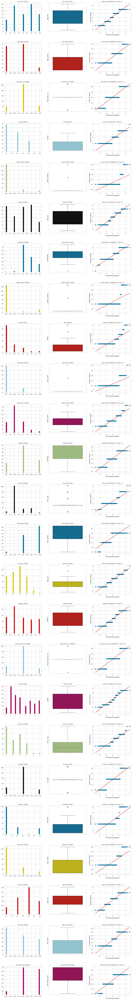

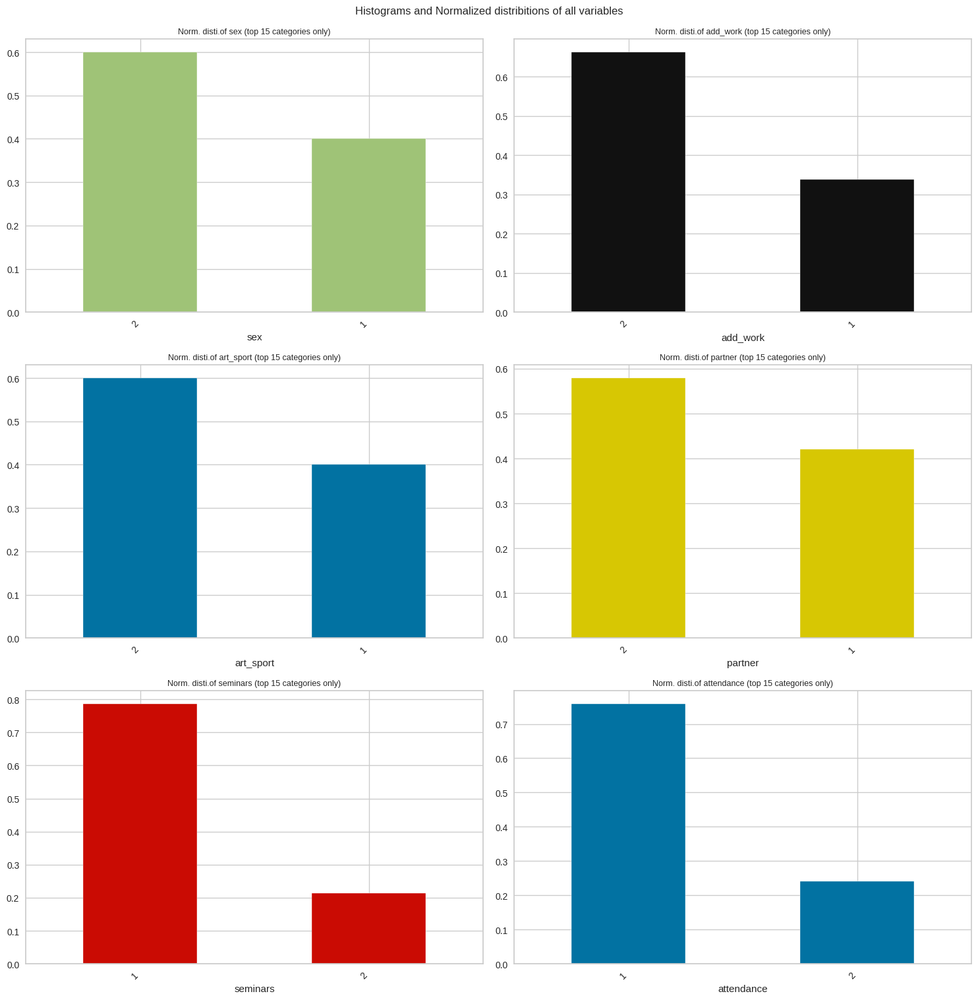

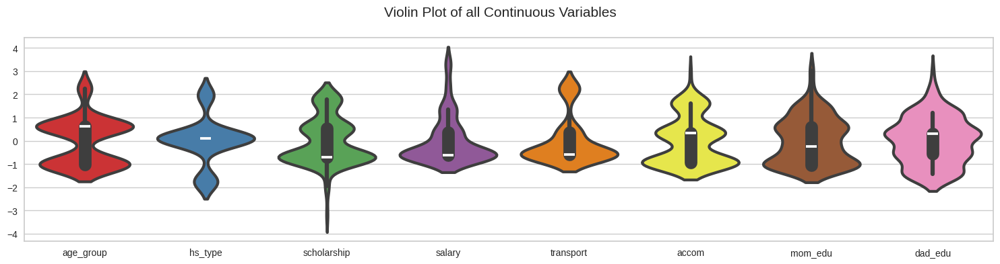

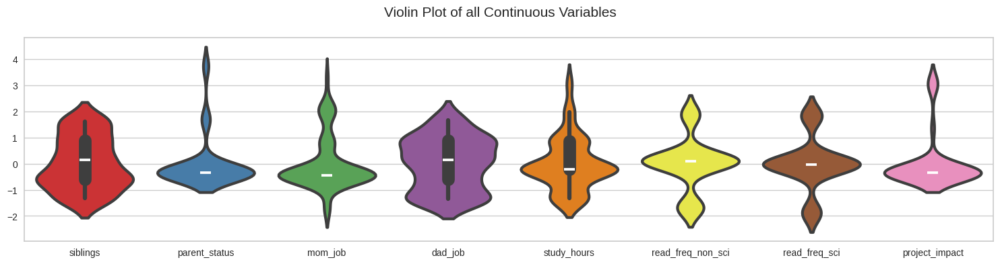

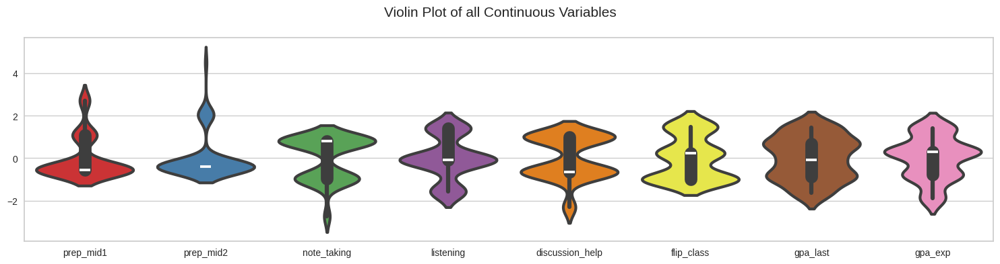

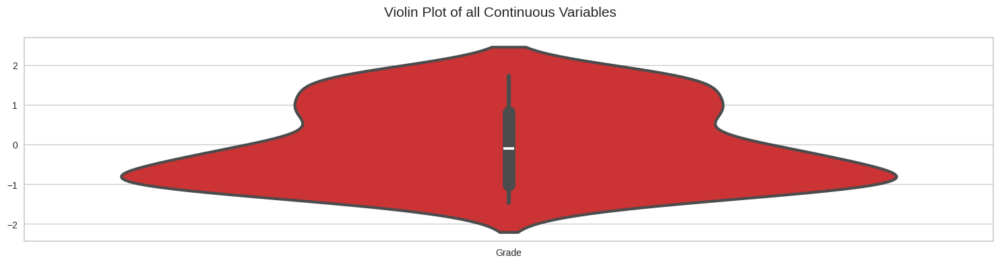

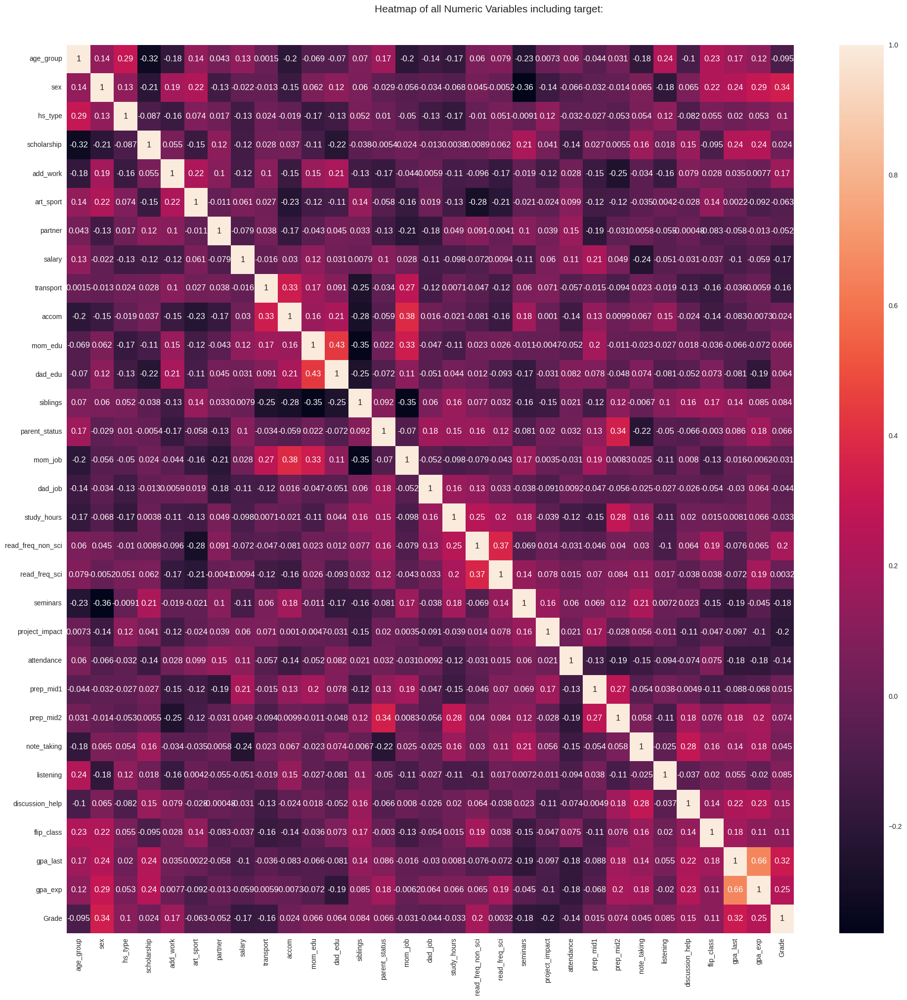

All Plots done
Time to run AutoViz = 119 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
# AutoViz visualization
AV = AutoViz_Class()
auto_viz = AV.AutoViz("cleaned_student_data.csv")

# Prepare Data

In [ ]:
df.drop(columns=[
    "mom_edu", "dad_edu", "accom", "siblings", "parent_status",
    "mom_job", "dad_job", "age_group",
    "gpa_last", "gpa_exp", "salary", "partner"
], inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145 entries, 0 to 144
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   sex                145 non-null    int64
 1   hs_type            145 non-null    int64
 2   scholarship        145 non-null    int64
 3   add_work           145 non-null    int64
 4   art_sport          145 non-null    int64
 5   transport          145 non-null    int64
 6   study_hours        145 non-null    int64
 7   read_freq_non_sci  145 non-null    int64
 8   read_freq_sci      145 non-null    int64
 9   seminars           145 non-null    int64
 10  project_impact     145 non-null    int64
 11  attendance         145 non-null    int64
 12  prep_mid1          145 non-null    int64
 13  prep_mid2          145 non-null    int64
 14  note_taking        145 non-null    int64
 15  listening          145 non-null    int64
 16  discussion_help    145 non-null    int64
 17  flip_class      

# Model

In [ ]:
# Map numeric grades to categorical labels
grade_label_map = {
    0: "Low",    # Failing
    1: "Low",
    2: "Low",
    3: "Low", # Passing
    4: "High",
    5: "High",
    6: "High",   # Top
    7: "High"
}

# Apply the map to create the categorical target
df['Grade'] = df['Grade'].map(grade_label_map)

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145 entries, 0 to 144
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   sex                145 non-null    int64 
 1   hs_type            145 non-null    int64 
 2   scholarship        145 non-null    int64 
 3   add_work           145 non-null    int64 
 4   art_sport          145 non-null    int64 
 5   transport          145 non-null    int64 
 6   study_hours        145 non-null    int64 
 7   read_freq_non_sci  145 non-null    int64 
 8   read_freq_sci      145 non-null    int64 
 9   seminars           145 non-null    int64 
 10  project_impact     145 non-null    int64 
 11  attendance         145 non-null    int64 
 12  prep_mid1          145 non-null    int64 
 13  prep_mid2          145 non-null    int64 
 14  note_taking        145 non-null    int64 
 15  listening          145 non-null    int64 
 16  discussion_help    145 non-null    int64 
 1

In [ ]:
# Setup PyCaret
# Setup PyCaret with excluded features
clf = setup(
    data=df,
    target='Grade',
    session_id=4322
)

# Compare only Random Forest
best_model = compare_models(include=['rf'])

,Description,Value
0,Session id,4322
1,Target,Grade
2,Target type,Binary
3,Target mapping,"High: 0, Low: 1"
4,Original data shape,"(145, 19)"
5,Transformed data shape,"(145, 19)"
6,Transformed train set shape,"(101, 19)"
7,Transformed test set shape,"(44, 19)"
8,Numeric features,18
9,Preprocess,True


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7227,0.7551,0.7227,0.7228,0.7131,0.4183,0.4198,0.9240


Processing:   0%|          | 0/9 [00:00<?, ?it/s]

In [ ]:
df.value_counts('Grade')


,count
Grade,
Low,88
High,57


# Evaluate

In [ ]:
# Create and evaluate a Random Forest model
rf_model = create_model('rf')
evaluate_model(rf_model)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7273,0.6964,0.7273,0.7197,0.7169,0.3774,0.3858
1,0.8000,0.7500,0.8000,0.8000,0.8000,0.5833,0.5833
2,0.7000,0.7917,0.7000,0.6952,0.6901,0.3478,0.3563
3,0.6000,0.7083,0.6000,0.5750,0.5619,0.0909,0.1021
4,0.3000,0.5833,0.3000,0.3143,0.2788,-0.2963,-0.3563
5,0.7000,0.6667,0.7000,0.6952,0.6901,0.3478,0.3563
6,0.6000,0.6875,0.6000,0.6000,0.6000,0.1667,0.1667
7,0.9000,0.7917,0.9000,0.9143,0.8967,0.7826,0.8018
8,0.9000,0.8750,0.9000,0.9143,0.8967,0.7826,0.8018


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

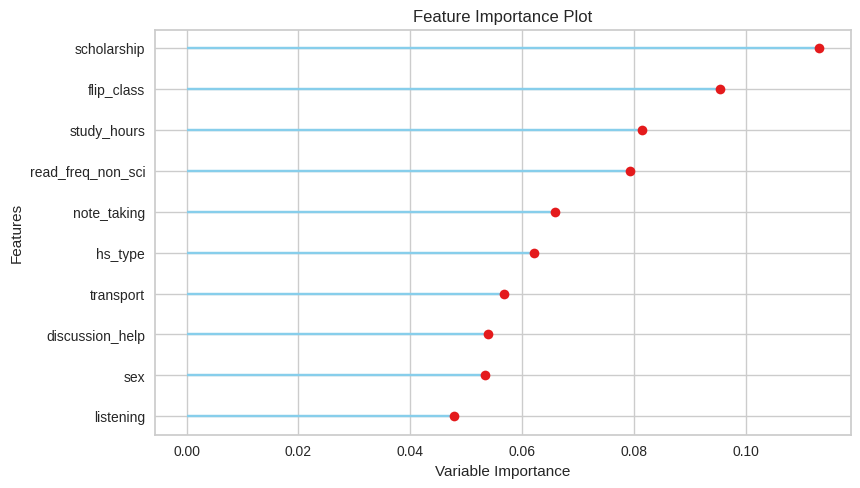

In [ ]:
# Plot feature importance
plot_model(rf_model, plot='feature')

# Tune, Best Model

In [ ]:
tuned_rf = tune_model(rf_model)
final_rf = finalize_model(tuned_rf)
save_model(final_rf, 'final_rf_model')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5455,0.6786,0.5455,0.3818,0.4492,-0.1702,-0.2390
1,0.6000,0.6250,0.6000,0.6000,0.6000,0.1667,0.1667
2,0.8000,0.8333,0.8000,0.8500,0.7810,0.5455,0.6124
3,0.7000,0.5833,0.7000,0.8000,0.6400,0.2857,0.4082
4,0.6000,0.5833,0.6000,0.6000,0.6000,0.1667,0.1667
5,0.6000,0.7083,0.6000,0.5750,0.5619,0.0909,0.1021
6,0.5000,0.7500,0.5000,0.4762,0.4835,-0.0870,-0.0891
7,0.8000,0.7500,0.8000,0.8500,0.7810,0.5455,0.6124
8,0.8000,0.7917,0.8000,0.8500,0.7810,0.5455,0.6124


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('label_encoding',
                  TransformerWrapperWithInverse(exclude=None, include=None,
                                                transformer=LabelEncoder())),
                 ('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['sex', 'hs_type', 'scholarship',
                                              'add_work', 'art_sport',
                                              'transport', 'study_hours',
                                              'read_freq_non_sci',
                                              'read_freq_sci', 'seminars',
                                              'project_impac...
                  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                         class_weight=None, criterion='gini',
                                         max_depth=None, max_features='sqrt',
                      

# References

- Titanic dataset from seaborn
- PyCaret Documentation: https://pycaret.gitbook.io/docs/
- AutoViz GitHub: https://github.com/AutoViML/AutoViz